In [2]:
import xarray as xr
from pathlib import Path
from xhistogram.xarray import histogram as xhist
import numpy as np
import pandas as pd

In [3]:
from dask.distributed import Client
client = Client(n_workers=2, threads_per_worker=3, memory_limit=15e9)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 2
Total threads: 6,Total memory: 27.94 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:44527,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:36289,Total threads: 3
Dashboard: http://127.0.0.1:45447/status,Memory: 13.97 GiB
Nanny: tcp://127.0.0.1:35243,


In [4]:
stores1 = sorted(Path("/work/bk1450/b383184/Amazon/Atlantic/data/tracks_4567").glob("Parcels_run_*_*.zarr"))
stores2  = sorted(Path("/work/bk1450/b383184/Amazon/Atlantic/data/tracks_3456").glob("Parcels_run_*_*.zarr"))
stores3 = sorted(Path("/work/bk1450/b383184/Amazon/Atlantic/data/tracks_2345").glob("Parcels_run_*_*.zarr"))

stores = stores1+stores2+stores3
stores[:3]

[PosixPath('/work/bk1450/b383184/Amazon/Atlantic/data/tracks_4567/Parcels_run_4567_2022-06-05.zarr'),
 PosixPath('/work/bk1450/b383184/Amazon/Atlantic/data/tracks_4567/Parcels_run_4567_2022-06-10.zarr'),
 PosixPath('/work/bk1450/b383184/Amazon/Atlantic/data/tracks_4567/Parcels_run_4567_2022-06-15.zarr')]

In [5]:
ds_list = [xr.open_zarr(s) for s in stores]
ds = xr.concat(ds_list,dim='trajectory')

ds = ds.drop_vars(['z','age','sal','temp'])
ds

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/dask/array/core.py:4998: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/dask/array/core.py:4998: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/dask/array/core.py:4998: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


<xarray.Dataset> Size: 91GB
Dimensions:     (trajectory: 6160000, obs: 925)
Coordinates:
  * obs         (obs) int32 4kB 0 1 2 3 4 5 6 7 ... 918 919 920 921 922 923 924
  * trajectory  (trajectory) int64 49MB 0 1 2 3 4 5 ... 9995 9996 9997 9998 9999
Data variables:
    lat         (trajectory, obs) float32 23GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    lon         (trajectory, obs) float32 23GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    time        (trajectory, obs) datetime64[ns] 46GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
Attributes:
    Conventions:            CF-1.6/CF-1.7
    feature_type:           trajectory
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_kernels:        JITParticleAdvectionRK4_3DCheckError
    parcels_mesh:           spherical
    parcels_version:        3.1.2

In [6]:
num_valid_obs_steps = int(ds.lat.notnull().any('trajectory').sum().compute().data[()])
ds = ds.isel(obs=slice(None, num_valid_obs_steps))
ds

<xarray.Dataset> Size: 73GB
Dimensions:     (trajectory: 6160000, obs: 741)
Coordinates:
  * obs         (obs) int32 3kB 0 1 2 3 4 5 6 7 ... 734 735 736 737 738 739 740
  * trajectory  (trajectory) int64 49MB 0 1 2 3 4 5 ... 9995 9996 9997 9998 9999
Data variables:
    lat         (trajectory, obs) float32 18GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    lon         (trajectory, obs) float32 18GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    time        (trajectory, obs) datetime64[ns] 37GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
Attributes:
    Conventions:            CF-1.6/CF-1.7
    feature_type:           trajectory
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_kernels:        JITParticleAdvectionRK4_3DCheckError
    parcels_mesh:           spherical
    parcels_version:        3.1.2

In [7]:
ds = ds.assign(start_time=ds.time.isel(obs=0).compute())

In [8]:
lat_min=ds.lat.min().compute().data[()]
lon_min=ds.lon.min().compute().data[()]

lat_max=ds.lat.max().compute().data[()]
lon_max=ds.lon.max().compute().data[()]

## Histogram calculation 5 daily

In [9]:
lat_bins = np.linspace(lat_min, lat_max, 30)
lon_bins = np.linspace(lon_min, lon_max, 80)

In [10]:
def calc_hist(ds):
    return xhist(
        ds.lon,
        ds.lat,
        bins=[lon_bins, lat_bins],
        dim=["trajectory", ],
        bin_dim_suffix=""
    )

In [11]:
# calc hist for each start year / start month
hist = ds.groupby(["start_time"]).apply(calc_hist)

# aggregate obs into 5 day bins (with 4 steps each day), skipping the initial positions
hist = hist.isel(obs=slice(1, None)).coarsen(obs=4 * 5, boundary="trim").sum()

# compute and store to file
hist.drop_encoding().compute().to_netcdf("_hist_AT_N_congress.nc")

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 36.01 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


## Histogram calculation monthly

In [12]:
ds = ds.assign(start_season=ds.start_time.dt.season)
ds

<xarray.Dataset> Size: 73GB
Dimensions:       (trajectory: 6160000, obs: 741)
Coordinates:
  * obs           (obs) int32 3kB 0 1 2 3 4 5 6 ... 734 735 736 737 738 739 740
  * trajectory    (trajectory) int64 49MB 0 1 2 3 4 ... 9995 9996 9997 9998 9999
Data variables:
    lat           (trajectory, obs) float32 18GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    lon           (trajectory, obs) float32 18GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    time          (trajectory, obs) datetime64[ns] 37GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    start_time    (trajectory) datetime64[ns] 49MB 2022-06-05 ... 2025-06-05
    start_season  (trajectory) <U3 74MB 'JJA' 'JJA' 'JJA' ... 'JJA' 'JJA' 'JJA'
Attributes:
    Conventions:            CF-1.6/CF-1.7
    feature_type:           trajectory
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_kernels:        JITParticleAdvectionRK4_3DCheckError
    parcels_mesh:           spherical
    parcels_version:        3.1.2

In [13]:
hist_season = ds.groupby(["start_season"]).apply(calc_hist)

# aggregate obs into 5 day bins (with 4 steps each day), skipping the initial positions
hist_season = hist_season.isel(obs=slice(1, None)).coarsen(obs=4 * 5, boundary="trim").sum()

# compute and store to file
hist_season.drop_encoding().compute().to_netcdf("_hist_Season_N_congress.nc")

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 19.45 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


## Plots

### Seasonality

In [14]:
hist_season = xr.open_dataset("_hist_Season_N_congress.nc").compute().histogram_lon_lat
hist_season

<xarray.DataArray 'histogram_lon_lat' (start_season: 4, obs: 37, lon: 79,
                                       lat: 29)> Size: 3MB
array([[[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
...
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 5, 0, 0],
         [0, 0, 0, ..., 6, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]]]], shape=(4, 37, 79, 29))
Coordinates:
  * obs           (obs) float64 296B 10.5 30.5 50.5 70.5 ... 690.5 710.5 730.5
  * lon           (lon) float32 316B -89.18 -88.05 -86.91 ... -1.704 -0.5681
  * lat           (lat) float32 116B -5.423 -4.183 -2.943 ... 26.82 28.06 29.3
  * start_season  (start_season) <U3 48B 'DJF' 'JJA' 'MAM' 'SON'

In [15]:
import matplotlib as mpl
import cartopy.feature as cf
from matplotlib.patches import Patch

alpha = 0.5  # 0..1

# navy = (0/255, 0/255, 128/255, alpha)  # RGBA for navy
# sienna = (*mpl.colors.to_rgb('#a0522d'), alpha)
# paleturq = (*mpl.colors.to_rgb('#afeeee'), alpha)
# rdm_color = (*mpl.colors.to_rgb('#ff0000'), alpha)

# bluenavy_ = mpl.colors.ListedColormap([navy])
# sienna_ = mpl.colors.ListedColormap([sienna])
# paleturq_ = mpl.colors.ListedColormap([paleturq])
# rdm_ = mpl.colors.ListedColormap([rdm_color])

data0 = hist_season.sel(start_season='DJF').sum("obs")
data1 = hist_season.sel(start_season='MAM').sum("obs")
data2 = hist_season.sel(start_season='JJA').sum("obs")
data3 = hist_season.sel(start_season='SON').sum("obs")


# ##plot
# # fig,ax = plt.axes(projection=cartopy.crs.PlateCarree(),figsize=(7,14))

# fig, ax = plt.subplots(1, 1, figsize=(10,20), subplot_kw=dict(projection=ccrs.PlateCarree()))

# np.log10(data0).plot.contourf(
#                 x="lon", y="lat",
#                 transform=ccrs.PlateCarree(), ax=ax,
#                 add_colorbar=False,colors='#000080',alpha = 0.5,label='DJF'
#             )

# np.log10(data1).plot.contourf(
#                 x="lon", y="lat",
#                 transform=ccrs.PlateCarree(), ax=ax,
#                 add_colorbar=False,colors='#a0522d',alpha = 0.5,label='MAM'
#             )

# np.log10(data2).plot.contourf(
#                 x="lon", y="lat",
#                 transform=ccrs.PlateCarree(), ax=ax,
#                 add_colorbar=False,colors='#afeeee',alpha = 0.5,label='JJA'
#             )

# np.log10(data3).plot.contourf(
#                 x="lon", y="lat",
#                 transform=ccrs.PlateCarree(), ax=ax,
#                 add_colorbar=False,colors='#ff0000',alpha = 0.5,label='SON'
#             )

# ax.coastlines()
# ax.set_title('Seasonality')
# ax.coastlines(resolution='10m')
# ax.add_feature(cf.BORDERS)
# ax.add_feature(cf.LAND, facecolor='#8e9497ff')

# ax.set_xticks(np.arange(np.round(hist_season.lon.min().data),np.round(hist_season.lon.max().data),5))
# ax.set_yticks(np.arange(np.round(hist_season.lat.min().data),np.round(hist_season.lat.max().data),5))

# # ax.set_xticklabels(['88°W','83°W','78°W','68°W','63°W','2°W','0°','2°E',
# #                     '4°E','6°E','8°E','10°E'],fontsize=14)
# handles = [
#     Patch(color='#000080', alpha=0.5, label='DJF'),
#     Patch(color='#a0522d', alpha=0.5, label='MAM'),
#     Patch(color='#afeeee', alpha=0.5, label='JJA'),
#     Patch(color='#ff0000', alpha=0.5, label='SON'),
# ]
# ax.legend(handles=handles, title='Season', loc='upper right', frameon=True, handlelength=1.5)

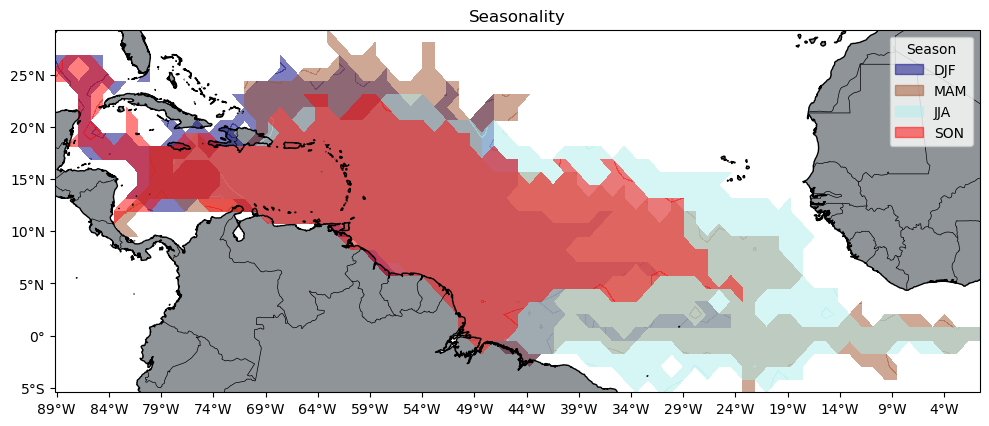

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.patches as mpatches

labels_colors = [
    ('DJF', '#000080'),
    ('MAM', '#a0522d'),
    ('JJA', '#afeeee'),
    ('SON', '#ff0000'),
]

def log10_safe(da):
    return da.where(da > 0).pipe(np.log10)

fig, ax = plt.subplots(1, 1, figsize=(10, 20),
                       subplot_kw=dict(projection=ccrs.PlateCarree()))

# Plot layers
layers = [
    (data0, '#000080', 'DJF'),
    (data1, '#a0522d', 'MAM'),
    (data2, '#afeeee', 'JJA'),
    (data3, '#ff0000', 'SON'),
]
for da, color, _ in layers:
    log10_safe(da).plot.contourf(
        x='lon', y='lat', ax=ax, transform=ccrs.PlateCarree(),
        add_colorbar=False, colors=[color], alpha=0.5, levels = [1,hist_season.max()]
    )

# Map cosmetics
ax.set_title('Seasonality')
ax.coastlines(resolution='10m')
ax.add_feature(cf.BORDERS, linewidth=0.5)
ax.add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)

# Ticks + formatters
lon_ticks = np.arange(np.round(hist_season.lon.min().item()),
                      np.round(hist_season.lon.max().item()) + 1e-6, 5)
lat_ticks = np.arange(np.round(hist_season.lat.min().item()),
                      np.round(hist_season.lat.max().item()) + 1e-6, 5)
ax.set_xticks(lon_ticks, crs=ccrs.PlateCarree())
ax.set_yticks(lat_ticks, crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
ax.yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
ax.set_xlabel('')
ax.set_ylabel('')

# Legend (proxy patches)
handles = [mpatches.Patch(color=c, alpha=0.5, label=lab) for _, c, lab in layers]
ax.legend(handles=handles, title='Season', loc='upper right', frameon=True)

plt.tight_layout()
# plt.savefig("seasonality.png", dpi=300, bbox_inches="tight")
plt.show()


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


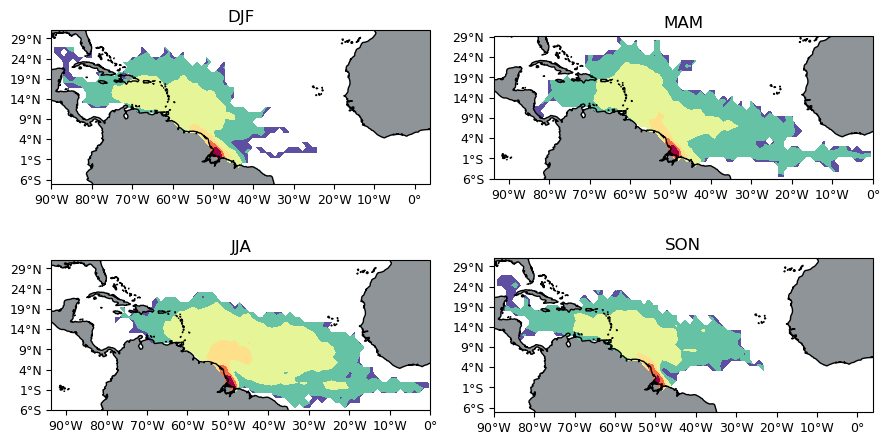

In [17]:
# seasons = np.unique(hist_season.start_season)  # expect 4
seasons = ['DJF','MAM','JJA','SON']

fig, ax = plt.subplots(2, 2, figsize=(9, 7),
                       subplot_kw=dict(projection=ccrs.PlateCarree()))
ax = ax.ravel()

for i in range(len(seasons)):
    dd = hist_season.sel(start_season=str(seasons[i])).sum("obs")

    np.log10(dd).plot.contourf(
        x='lon', y='lat', ax=ax[i], transform=ccrs.PlateCarree(),
        add_colorbar=False, cmap='Spectral_r'
    )
    ax[i].coastlines()
    ax[i].set_title(seasons[i], fontsize=12)
    ax[i].add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    ax[i].set_xticks(np.arange(np.floor(dd.lon.min()), np.ceil(dd.lon.max())+1e-6, 10), crs=ccrs.PlateCarree())
    ax[i].set_yticks(np.arange(np.floor(dd.lat.min()), np.ceil(dd.lat.max())+1e-6, 5), crs=ccrs.PlateCarree())
    ax[i].xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
    ax[i].yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
    ax[i].tick_params(labelsize=9)
    ax[i].set_ylabel('')
    ax[i].set_xlabel('')

fig.subplots_adjust(wspace=0.2, hspace=-0.65)
plt.tight_layout()
# plt.savefig("seasonality_subplots.png", dpi=300, bbox_inches="tight")
plt.show()


In [18]:
# seasons = ['DJF','MAM','JJA','SON']  # explicit order
# fig, axes = plt.subplots(
#     2, 2, figsize=(10, 7),
#     subplot_kw=dict(projection=ccrs.PlateCarree()),
#     constrained_layout=True
# )
# axes = axes.ravel()

# fig.tight_layout(pad=0.1)
# fig.subplots_adjust(wspace=0.1, hspace=-0.5)

# def log10_safe(da): 
#     return da.where(da > 0).pipe(np.log10)

# dlogs = [log10_safe(hist_season.sel(start_season=s).sum('obs')) for s in seasons]
# vmin = min(float(np.nanmin(d.values)) for d in dlogs)
# vmax = max(float(np.nanmax(d.values)) for d in dlogs)
# cmap = 'Spectral_r'

# for ax, s, dlog in zip(axes, seasons, dlogs):
#     im = ax.contourf(
#         dlog.lon, dlog.lat, dlog,
#         levels=10, vmin=vmin, vmax=vmax,
#         cmap=cmap, transform=ccrs.PlateCarree()
#     )
#     ax.set_title(s, fontsize=12)
#     ax.coastlines(resolution='10m', linewidth=0.6)
#     ax.add_feature(cf.BORDERS, linewidth=0.3)
#     # ax.add_feature(cf.LAND, facecolor='#e8e8e8', zorder=0)
#     ax.add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)

#     ax.set_xticks(np.arange(np.floor(dlog.lon.min()), np.ceil(dlog.lon.max())+1e-6, 10), crs=ccrs.PlateCarree())
#     ax.set_yticks(np.arange(np.floor(dlog.lat.min()), np.ceil(dlog.lat.max())+1e-6, 5), crs=ccrs.PlateCarree())
#     ax.xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
#     ax.yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
#     ax.tick_params(labelsize=9)

# # shared colorbar (vertical)
# cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.013, pad=0.01, aspect=35)
# cbar.set_label('log10(count)', fontsize=11)
# cbar.ax.tick_params(labelsize=9)

# plt.tight_layout()
# # plt.savefig("seasonality_subplots.png", dpi=300, bbox_inches="tight")
# plt.show()

### Hist Mesoescale

In [3]:
import math
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.patches as mpatches

In [4]:
hist_5 = xr.open_dataset("_hist_AT_N_congress.nc").compute().histogram_lon_lat
print(hist_5)

<xarray.DataArray 'histogram_lon_lat' (start_time: 260, obs: 37, lon: 79,
                                       lat: 29)> Size: 176MB
array([[[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
...
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
   

In [5]:
# dat = hist_5.isel(start_time=132).sum("obs")

# fig, ax = plt.subplots(1, 1, figsize=(10,20), subplot_kw=dict(projection=cartopy.crs.PlateCarree()))
# np.log10(dat).plot.contourf(
#                 x="lon", y="lat",
#                 transform=cartopy.crs.PlateCarree(), ax=ax,
#                 add_colorbar=False,colors='#000080',alpha = 0.5, levels=[0,hist_5.max()]
#             )
# ax.coastlines()

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


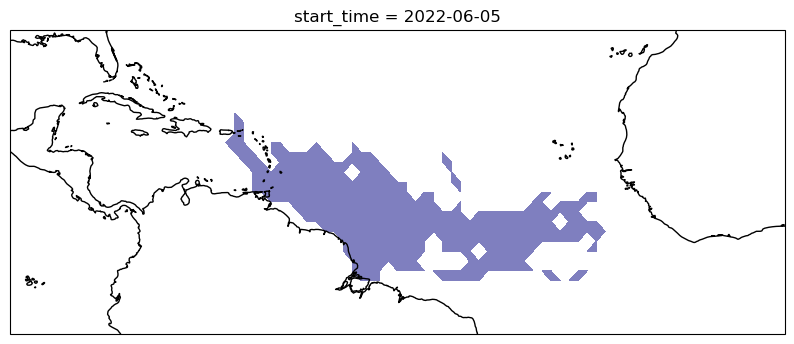

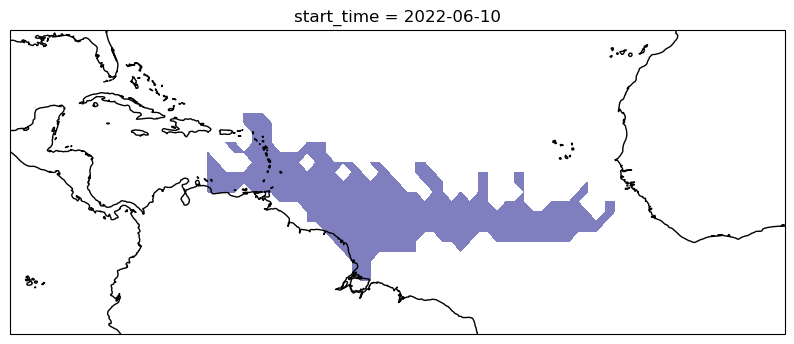

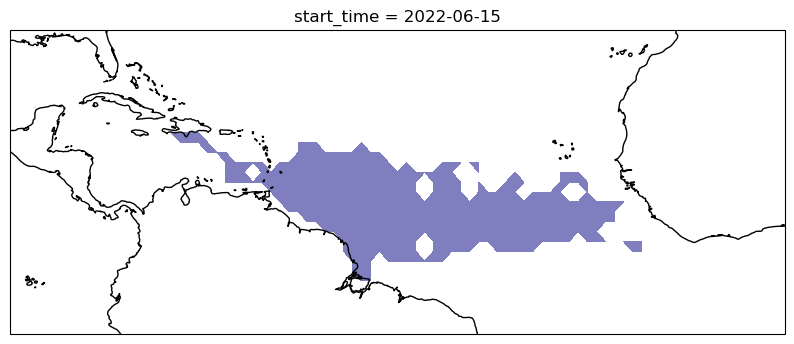

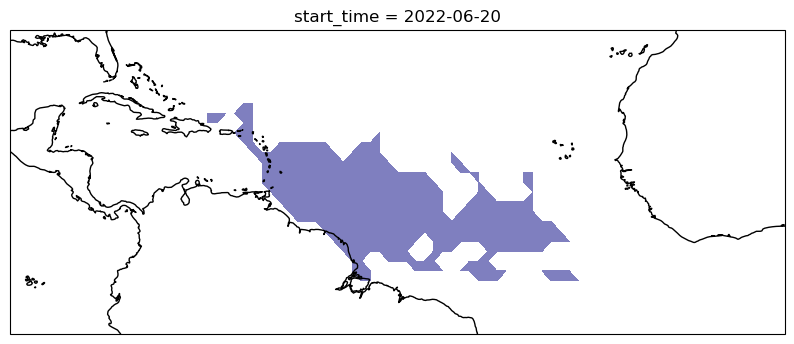

In [6]:
# for i in range(len(hist_5.start_time)):
for i in range(0,4): 
    
    dat = hist_5.isel(start_time=i).sum("obs")
    
    fig, ax = plt.subplots(1, 1, figsize=(10,20), subplot_kw=dict(projection=ccrs.PlateCarree()))
    np.log10(dat).plot.contourf(
                    x="lon", y="lat",
                    transform=ccrs.PlateCarree(), ax=ax,
                    add_colorbar=False,colors='#000080',alpha = 0.5, levels=[0,hist_5.max()]
                )
    ax.coastlines()

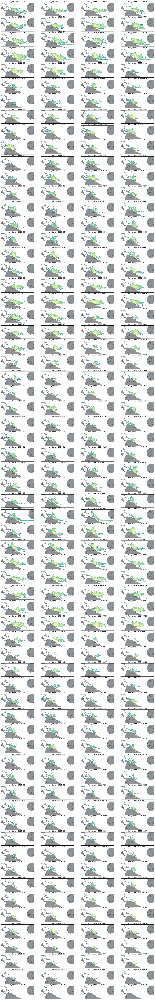

In [7]:
import math

da = hist_5.sum("obs")                 # (start_time, lon, lat)
dlog = da.where(da > 0).map_blocks(np.log10)

n = dlog.sizes["start_time"]           # 260
cols = 4
rows = math.ceil(n / cols)             # 65

# common color scale
vmin = float(np.nanmin(dlog.values))
vmax = float(np.nanmax(dlog.values))

fig, axes = plt.subplots(rows, cols, figsize=(4.0*cols, 2.8*rows),
                         subplot_kw=dict(projection=ccrs.PlateCarree()))
axes = np.asarray(axes).ravel()

fig.tight_layout(pad=0.1)
fig.subplots_adjust(wspace=0.2, hspace=-0.98)

for i in range(n):
    ax = axes[i]
    slc = dlog.isel(start_time=i)
    im = slc.plot.contourf(
        x="lon", y="lat", ax=ax, transform=ccrs.PlateCarree(),
        levels=20, vmin=vmin, vmax=vmax, cmap="Spectral_r", add_colorbar=False
    )
    # ax.set_title(np.datetime_as_string(slc.start_time.item(), unit='D'), fontsize=7)
    ax.coastlines(resolution='110m', linewidth=0.3)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    ax.add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    ax.add_feature(cf.BORDERS, linewidth=0.3)

# remove any unused axes (none expected here)
for j in range(n, rows*cols):
    fig.delaxes(axes[j])

# shared colorbar
# cbar = fig.colorbar(im, ax=axes[:n], orientation='vertical',
#                     fraction=0.02, pad=0.01, aspect=40)
# cbar.set_label('log10(count)')
# plt.tight_layout()
# plt.savefig("Mesoescale.pdf")  # dpi not needed
plt.show()

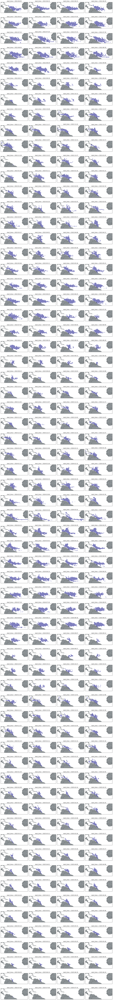

In [8]:
da = hist_5.sum("obs")                 # (start_time, lon, lat)
dlog = da.where(da > 0).map_blocks(np.log10)

n = dlog.sizes["start_time"]           # 260
cols = 4
rows = math.ceil(n / cols)             # 65

fig, axes = plt.subplots(rows, cols, figsize=(4.0*cols, 2.8*rows),
                         subplot_kw=dict(projection=ccrs.PlateCarree()))
axes = np.asarray(axes).ravel()

fig.tight_layout(pad=0.1)
fig.subplots_adjust(wspace=0.3, hspace=-0.95)

for i in range(n):
    ax = axes[i]
    slc = dlog.isel(start_time=i)
    im = slc.plot.contourf(
        x="lon", y="lat", ax=ax, transform=ccrs.PlateCarree(),
        colors='#000080',alpha = 0.5, levels=[0,hist_5.max()], add_colorbar=False
    )
    # ax.set_title(np.datetime_as_string(slc.start_time.item(), unit='D'), fontsize=7)
    ax.coastlines(resolution='110m', linewidth=0.3)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    ax.add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    ax.add_feature(cf.BORDERS, linewidth=0.3)

# remove any unused axes (none expected here)
for j in range(n, rows*cols):
    fig.delaxes(axes[j])

# shared colorbar
# cbar = fig.colorbar(im, ax=axes[:n], orientation='vertical',
#                     fraction=0.02, pad=0.01, aspect=40)
# cbar.set_label('log10(count)')
plt.tight_layout()
# plt.savefig("Mesoescale.pdf")  # dpi not needed
plt.show()

### SSH stream plot on particle tracks

In [9]:
ssh5 = xr.open_dataset('../output/ssh_5d_avg.nc')
ssh5 = ssh5.drop_sel(time='2022-06-01')
ssh5

<xarray.Dataset> Size: 360MB
Dimensions:    (latitude: 372, longitude: 1026, time: 236)
Coordinates:
    depth      float32 4B ...
  * latitude   (latitude) float32 1kB -4.333 -4.25 -4.167 ... 26.42 26.5 26.58
  * longitude  (longitude) float32 4kB -87.0 -86.92 -86.83 ... -1.667 -1.583
  * time       (time) datetime64[ns] 2kB 2022-06-06 2022-06-11 ... 2025-08-24
Data variables:
    zos        (time, latitude, longitude) float32 360MB ...

In [10]:
def ssh_stream_vectors(ssh2d):
    """
    Compute a vector field tangent to SSH contours for streamplot.

    Parameters
    ----------
    ssh2d : 2D array-like
        Sea surface height for a single time (and level), shape (ny, nx).

    Returns
    -------
    U, V : 2D numpy arrays
        Components suitable for plt.streamplot(lon, lat, U, V) in index space:
        U = -d(ssh)/dy, V = d(ssh)/dx
    """
    ETA = np.asarray(ssh2d)
    dETA_dy = np.gradient(ETA, axis=0)
    dETA_dx = np.gradient(ETA, axis=1)
    U = -dETA_dy
    V =  dETA_dx

    ny, nx = U.shape
    x = np.arange(nx)
    y = np.arange(ny)
    
    return U, V, x, y

### Salinity

#### 5 day mean

In [11]:
sal5 = xr.open_dataset('/work/bk1450/b383184/Amazon/Atlantic/data/tracers/sal5.nc')
sal5 = sal5.compute()
sal5

<xarray.Dataset> Size: 1GB
Dimensions:    (time: 241, latitude: 1201, longitude: 1201)
Coordinates:
    depth      float32 4B 0.494
  * latitude   (latitude) float32 5kB -50.0 -49.92 -49.83 ... 49.83 49.92 50.0
  * longitude  (longitude) float32 5kB -100.0 -99.92 -99.83 ... -0.08333 0.0
  * time       (time) datetime64[ns] 2kB 2022-06-01 2022-06-06 ... 2025-09-13
Data variables:
    so         (time, latitude, longitude) float32 1GB 34.16 34.17 ... 34.45
Attributes:
    credit:                    E.U. Copernicus Marine Service Information (CM...
    references:                http://marine.copernicus.eu
    contact:                   https://marine.copernicus.eu/contact
    institution:               Mercator Ocean International
    producer:                  CMEMS - Global Monitoring and Forecasting Centre
    title:                     daily mean fields from Global Ocean Physics An...
    source:                    MOI GLO12
    Conventions:               CF-1.8
    copernicusmarine_version:  2.2.0

2024-03-17T00:00:00.000000000
2024-03-17T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-03-22T00:00:00.000000000
2024-03-22T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-03-27T00:00:00.000000000
2024-03-27T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-04-01T00:00:00.000000000
2024-04-01T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


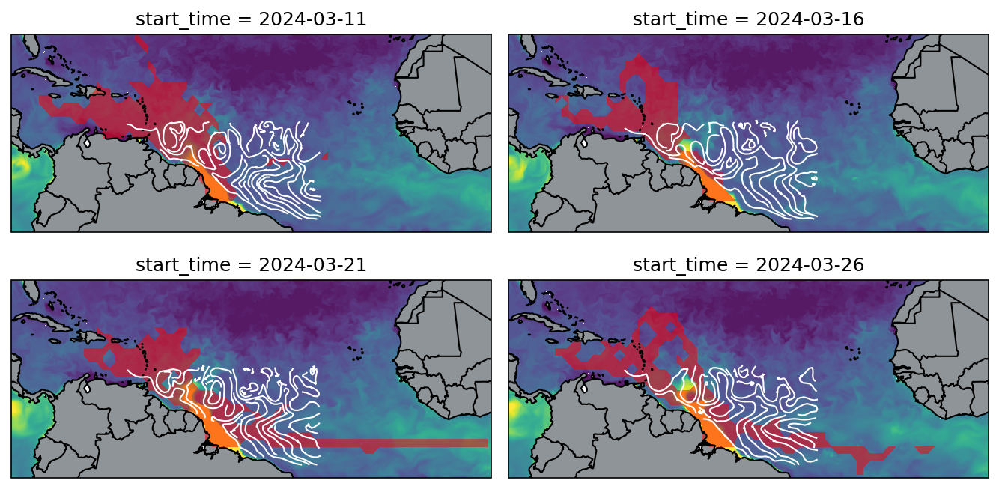

In [51]:
lon = ssh5.sel(longitude=slice(-65,-30),latitude=slice(-6,14)).longitude.values  # replace with your lon 1D
lat = ssh5.sel(longitude=slice(-65,-30),latitude=slice(-6,14)).latitude.values   # replace with your lat 1D

lon_sal = sal5['longitude'].values
lat_sal = sal5['latitude'].values 

## plotting
fig, ax = plt.subplots(2, 2, figsize=(9,7), subplot_kw=dict(projection=ccrs.PlateCarree()))
ax = ax.ravel()

jj=0
for i in range(130,134): 
    
    dat = hist_5.isel(start_time=i).sum("obs")
    ssh_ = ssh5.zos.isel(time=i).sel(longitude=slice(-65,-30),latitude=slice(-6,14)).squeeze()
    sal_ = sal5.so.isel(time=i+1)
    
    U, V,x,y = ssh_stream_vectors(ssh_)


    print(ssh5.time[i].values)
    print(sal5.time[i+1].values)
    
    
    fig.set_dpi(150)
    sal_.plot.pcolormesh(robust=True,cmap='viridis_r',alpha=0.9,add_colorbar=False,ax=ax[jj])
    np.log10(dat).plot.contourf(
                    x="lon", y="lat",
                    transform=ccrs.PlateCarree(), ax=ax[jj],
                    add_colorbar=False,colors='#ff0000',alpha = 0.5, levels=[0,hist_5.max()]
                )
    strm = ax[jj].streamplot(lon, lat, U, V,
                     transform=ccrs.PlateCarree(),  # tell Cartopy the data CRS
                     color='white', density=5, arrowsize=0.2, linewidth=1)
    
    
    ax[jj].coastlines()
    ax[jj].set_extent([-85, 0, -6, 29], crs=ccrs.PlateCarree())
    ax[jj].add_feature(cf.BORDERS)
    ax[jj].add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    # ax[jj].set_xticks(np.arange(np.floor(dat.lon.min()), np.ceil(dat.lon.max())+1e-6, 10), crs=ccrs.PlateCarree())
    # ax[jj].set_yticks(np.arange(np.floor(dat.lat.min()), np.ceil(dat.lat.max())+1e-6, 5), crs=ccrs.PlateCarree())
    # ax[jj].xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
    # ax[jj].yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
    # ax[jj].tick_params(labelsize=9)
    ax[jj].set_ylabel('')
    ax[jj].set_xlabel('')
    jj=jj+1
fig.subplots_adjust(wspace=0.2, hspace=-0.65)
plt.tight_layout()

plt.show()

#### 10 day mean

In [54]:
sal10 = xr.open_dataset('/work/bk1450/b383184/Amazon/Atlantic/data/tracers/sal10.nc')
sal10 = sal10.compute()
# sal10

In [57]:
ssh10 = ssh5.resample(time="10D").mean()
ssh10

<xarray.Dataset> Size: 180MB
Dimensions:    (time: 118, latitude: 372, longitude: 1026)
Coordinates:
    depth      float32 4B 0.494
  * latitude   (latitude) float32 1kB -4.333 -4.25 -4.167 ... 26.42 26.5 26.58
  * longitude  (longitude) float32 4kB -87.0 -86.92 -86.83 ... -1.667 -1.583
  * time       (time) datetime64[ns] 944B 2022-06-06 2022-06-16 ... 2025-08-19
Data variables:
    zos        (time, latitude, longitude) float32 180MB 0.2287 0.2277 ... nan

2024-03-17
2024-03-17


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-03-27
2024-03-27


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-04-06
2024-04-06


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-04-16
2024-04-16


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


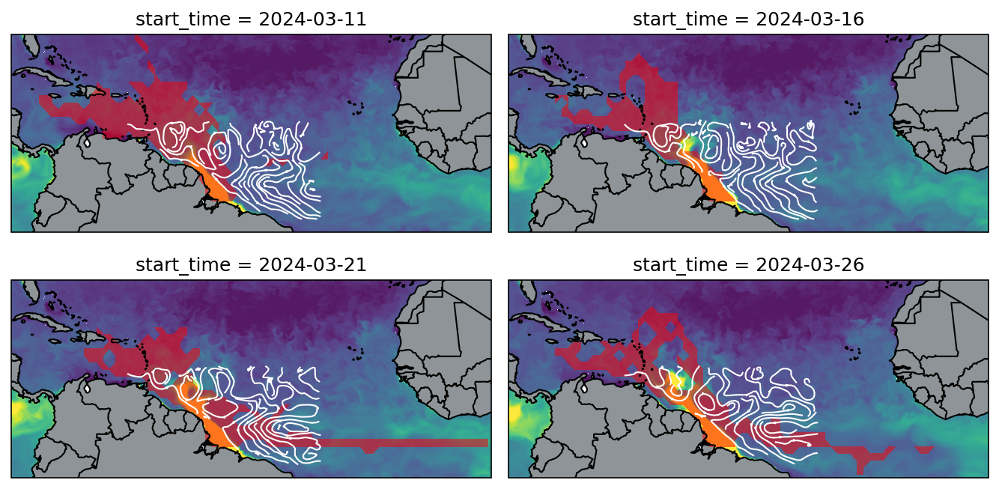

In [59]:
lon = ssh5.sel(longitude=slice(-65,-30),latitude=slice(-6,14)).longitude.values  # replace with your lon 1D
lat = ssh5.sel(longitude=slice(-65,-30),latitude=slice(-6,14)).latitude.values   # replace with your lat 1D

lon_sal = sal5['longitude'].values
lat_sal = sal5['latitude'].values 

SC = ['2024-03-17','2024-03-27','2024-04-06','2024-04-16','2024-04-26']

## plotting
fig, ax = plt.subplots(2, 2, figsize=(9,7), subplot_kw=dict(projection=ccrs.PlateCarree()))
ax = ax.ravel()

jj=0
for i in range(130,134): 
    
    dat = hist_5.isel(start_time=i).sum("obs")
    ssh_ = ssh5.zos.sel(time=SC[jj]).sel(longitude=slice(-65,-30),latitude=slice(-6,14)).squeeze()
    sal_ = sal5.so.sel(time=SC[jj])
    
    U, V,x,y = ssh_stream_vectors(ssh_)


    print(SC[jj])
    print(SC[jj])
    
    
    fig.set_dpi(150)
    sal_.plot.pcolormesh(robust=True,cmap='viridis_r',alpha=0.9,add_colorbar=False,ax=ax[jj])
    np.log10(dat).plot.contourf(
                    x="lon", y="lat",
                    transform=ccrs.PlateCarree(), ax=ax[jj],
                    add_colorbar=False,colors='#ff0000',alpha = 0.5, levels=[0,hist_5.max()]
                )
    strm = ax[jj].streamplot(lon, lat, U, V,
                     transform=ccrs.PlateCarree(),  # tell Cartopy the data CRS
                     color='white', density=5, arrowsize=0.2, linewidth=1)
    
    
    ax[jj].coastlines()
    ax[jj].set_extent([-85, 0, -6, 29], crs=ccrs.PlateCarree())
    ax[jj].add_feature(cf.BORDERS)
    ax[jj].add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    # ax[jj].set_xticks(np.arange(np.floor(dat.lon.min()), np.ceil(dat.lon.max())+1e-6, 10), crs=ccrs.PlateCarree())
    # ax[jj].set_yticks(np.arange(np.floor(dat.lat.min()), np.ceil(dat.lat.max())+1e-6, 5), crs=ccrs.PlateCarree())
    # ax[jj].xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
    # ax[jj].yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
    # ax[jj].tick_params(labelsize=9)
    ax[jj].set_ylabel('')
    ax[jj].set_xlabel('')
    jj=jj+1
fig.subplots_adjust(wspace=0.2, hspace=-0.65)
plt.tight_layout()

plt.show()

### UV

In [60]:
UV5 = xr.open_dataset('/work/bk1450/b383184/Amazon/Atlantic/data/tracers/ds_uv5.nc')
UV5 = UV5.compute()
UV5

<xarray.Dataset> Size: 4GB
Dimensions:    (latitude: 1201, longitude: 1201, time: 230)
Coordinates:
    depth      float32 4B 0.494
  * latitude   (latitude) float32 5kB -50.0 -49.92 -49.83 ... 49.83 49.92 50.0
  * longitude  (longitude) float32 5kB -100.0 -99.92 -99.83 ... -0.08333 0.0
  * time       (time) datetime64[ns] 2kB 2022-06-01 2022-06-06 ... 2025-07-20
Data variables:
    speed      (time, latitude, longitude) float32 1GB 0.1229 ... 0.04624
    KE         (time, latitude, longitude) float32 1GB 0.008573 ... 0.001227
    vorticity  (time, latitude, longitude) float32 1GB -4.963e-06 ... -1.164e-06

2024-03-17T00:00:00.000000000
2024-03-17T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-03-22T00:00:00.000000000
2024-03-22T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-03-27T00:00:00.000000000
2024-03-27T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-04-01T00:00:00.000000000
2024-04-01T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


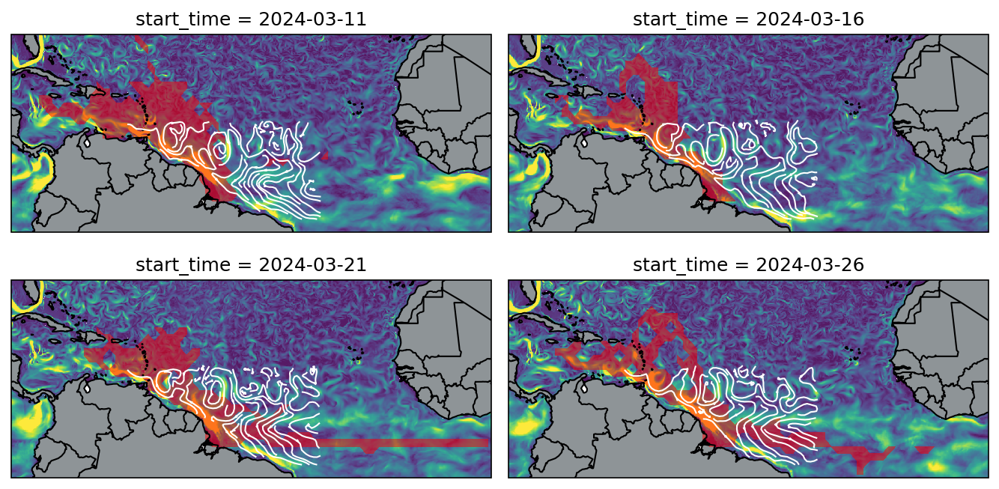

In [61]:
lon = ssh5.sel(longitude=slice(-65,-30),latitude=slice(-6,14)).longitude.values  # replace with your lon 1D
lat = ssh5.sel(longitude=slice(-65,-30),latitude=slice(-6,14)).latitude.values   # replace with your lat 1D

## plotting
fig, ax = plt.subplots(2, 2, figsize=(9,7), subplot_kw=dict(projection=ccrs.PlateCarree()))
ax = ax.ravel()

jj=0
for i in range(130,134): 
    
    dat = hist_5.isel(start_time=i).sum("obs")
    ssh_ = ssh5.zos.isel(time=i).sel(longitude=slice(-65,-30),latitude=slice(-6,14)).squeeze()
    uv_ = UV5.speed.isel(time=i+1)
    
    U, V,x,y = ssh_stream_vectors(ssh_)


    print(ssh5.time[i].values)
    print(sal5.time[i+1].values)
    
    
    fig.set_dpi(150)
    uv_.plot.pcolormesh(robust=True,cmap='viridis',alpha=0.9,add_colorbar=False,ax=ax[jj])
    np.log10(dat).plot.contourf(
                    x="lon", y="lat",
                    transform=ccrs.PlateCarree(), ax=ax[jj],
                    add_colorbar=False,colors='#ff0000',alpha = 0.5, levels=[0,hist_5.max()]
                )
    strm = ax[jj].streamplot(lon, lat, U, V,
                     transform=ccrs.PlateCarree(),  # tell Cartopy the data CRS
                     color='white', density=5, arrowsize=0.2, linewidth=1)
    
    
    ax[jj].coastlines()
    ax[jj].set_extent([-85, 0, -6, 29], crs=ccrs.PlateCarree())
    ax[jj].add_feature(cf.BORDERS)
    ax[jj].add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    # ax[jj].set_xticks(np.arange(np.floor(dat.lon.min()), np.ceil(dat.lon.max())+1e-6, 10), crs=ccrs.PlateCarree())
    # ax[jj].set_yticks(np.arange(np.floor(dat.lat.min()), np.ceil(dat.lat.max())+1e-6, 5), crs=ccrs.PlateCarree())
    # ax[jj].xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
    # ax[jj].yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
    # ax[jj].tick_params(labelsize=9)
    ax[jj].set_ylabel('')
    ax[jj].set_xlabel('')
    jj=jj+1
fig.subplots_adjust(wspace=0.2, hspace=-0.65)
plt.tight_layout()

plt.show()

#### Vorticity

2024-03-17T00:00:00.000000000
2024-03-17T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-03-22T00:00:00.000000000
2024-03-22T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-03-27T00:00:00.000000000
2024-03-27T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


2024-04-01T00:00:00.000000000
2024-04-01T00:00:00.000000000


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


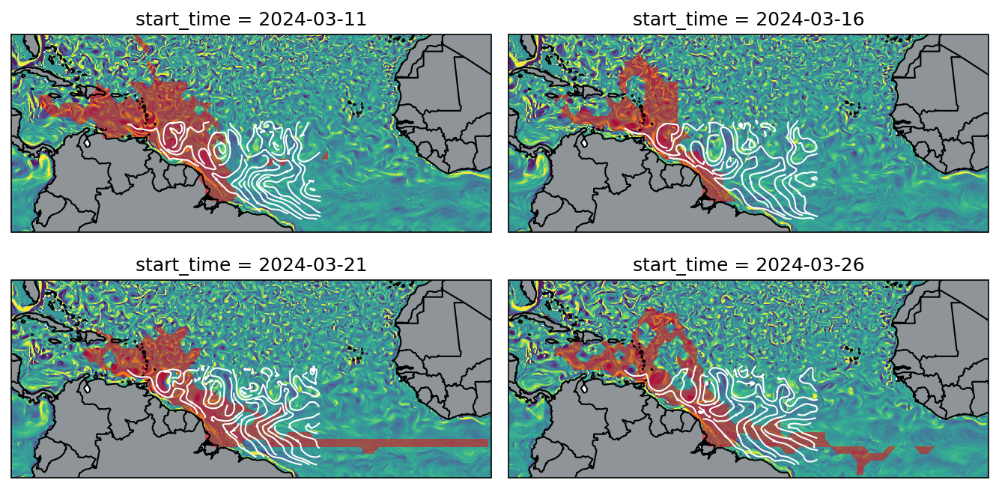

In [62]:
lon = ssh5.sel(longitude=slice(-65,-30),latitude=slice(-6,14)).longitude.values  # replace with your lon 1D
lat = ssh5.sel(longitude=slice(-65,-30),latitude=slice(-6,14)).latitude.values   # replace with your lat 1D

## plotting
fig, ax = plt.subplots(2, 2, figsize=(9,7), subplot_kw=dict(projection=ccrs.PlateCarree()))
ax = ax.ravel()

jj=0
for i in range(130,134): 
    
    dat = hist_5.isel(start_time=i).sum("obs")
    ssh_ = ssh5.zos.isel(time=i).sel(longitude=slice(-65,-30),latitude=slice(-6,14)).squeeze()
    uv_ = UV5.vorticity.isel(time=i+1)
    
    U, V,x,y = ssh_stream_vectors(ssh_)


    print(ssh5.time[i].values)
    print(sal5.time[i+1].values)
    
    
    fig.set_dpi(150)
    uv_.plot.pcolormesh(robust=True,cmap='viridis',alpha=0.9,add_colorbar=False,ax=ax[jj])
    np.log10(dat).plot.contourf(
                    x="lon", y="lat",
                    transform=ccrs.PlateCarree(), ax=ax[jj],
                    add_colorbar=False,colors='#ff0000',alpha = 0.5, levels=[0,hist_5.max()]
                )
    strm = ax[jj].streamplot(lon, lat, U, V,
                     transform=ccrs.PlateCarree(),  # tell Cartopy the data CRS
                     color='white', density=5, arrowsize=0.2, linewidth=1)
    
    
    ax[jj].coastlines()
    ax[jj].set_extent([-85, 0, -6, 29], crs=ccrs.PlateCarree())
    ax[jj].add_feature(cf.BORDERS)
    ax[jj].add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    # ax[jj].set_xticks(np.arange(np.floor(dat.lon.min()), np.ceil(dat.lon.max())+1e-6, 10), crs=ccrs.PlateCarree())
    # ax[jj].set_yticks(np.arange(np.floor(dat.lat.min()), np.ceil(dat.lat.max())+1e-6, 5), crs=ccrs.PlateCarree())
    # ax[jj].xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
    # ax[jj].yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
    # ax[jj].tick_params(labelsize=9)
    ax[jj].set_ylabel('')
    ax[jj].set_xlabel('')
    jj=jj+1
fig.subplots_adjust(wspace=0.2, hspace=-0.65)
plt.tight_layout()

plt.show()